# Tarea N°01

## Instrucciones

1.- Completa tus datos personales (nombre y rol USM) en siguiente celda.


* __Nombre__: Ariadne Sandoval Roa

* __Rol__: 201510503-0

2.- Debes _pushear_ este archivo con tus cambios a tu repositorio personal del curso, incluyendo datos, imágenes, scripts, etc.

3.- Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

## I.-  Imagenception

Desde [Wikipedia](https://es.wikipedia.org/wiki/RGB), __RGB__ (sigla en inglés de red, green, blue) es un modelo de color basado en la síntesis aditiva, con el que es posible representar un color mediante la mezcla por adición de los tres colores de luz primarios. El modelo de color RGB no define por sí mismo lo que significa exactamente rojo, verde o azul, por lo que los mismos valores RGB pueden mostrar colores notablemente diferentes en distintos dispositivos que usen este modelo de color. Aunque utilicen un mismo modelo de color, sus espacios de color pueden variar considerablemente.

Para indicar con qué proporción es mezclado cada color, se asigna un valor a cada uno de los colores primarios, de manera que el valor "0" significa que no interviene en la mezcla y, a medida que ese valor aumenta, se entiende que aporta más intensidad a la mezcla. Aunque el intervalo de valores podría ser cualquiera (valores reales entre 0 y 1, valores enteros entre 0 y 37, etc.), es frecuente que cada color primario se codifique con un byte (8 bits).

Así, de manera usual, la intensidad de cada una de las componentes se mide según una escala que va del 0 al 255 y cada color es definido por un conjunto de valores escritos entre paréntesis (correspondientes a valores "R", "G" y "B") y separados por comas.

El conjunto de todos los colores también se puede representar en forma de cubo. Cada color es un punto de la superficie o del interior de éste. La escala de grises estaría situada en la diagonal que une al color blanco con el negro.

![rgb](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/Avl3119color4a.svg/800px-Avl3119color4a.svg.png)

Para efectos prácticos del curso, es posible representar cada pixel de una imagen con un array de 3 dimensiones, cada valor representa a una de las capas RGB. Por lo tanto, una imagen de $n \times m$ pixeles se representa como un arreglo de dimension $(n, m , 3)$ En `Python` una de las librerías de procesamiento de imágenes más utilizada es `Pillow`.

Abrir una imagen es tan fácil como:

In [1]:
# librerias
import os
import numpy as np
from PIL import Image

In [2]:
gatito = Image.open(os.path.join("images", "gatito.png"))

Notar que la variable anterior es de una clase específica de la librería.

In [3]:
type(gatito)

PIL.PngImagePlugin.PngImageFile

Para ver la imagen en Jupyter puedes utilizar la misma técnica que con los `pd.DataFrames`, es decir:

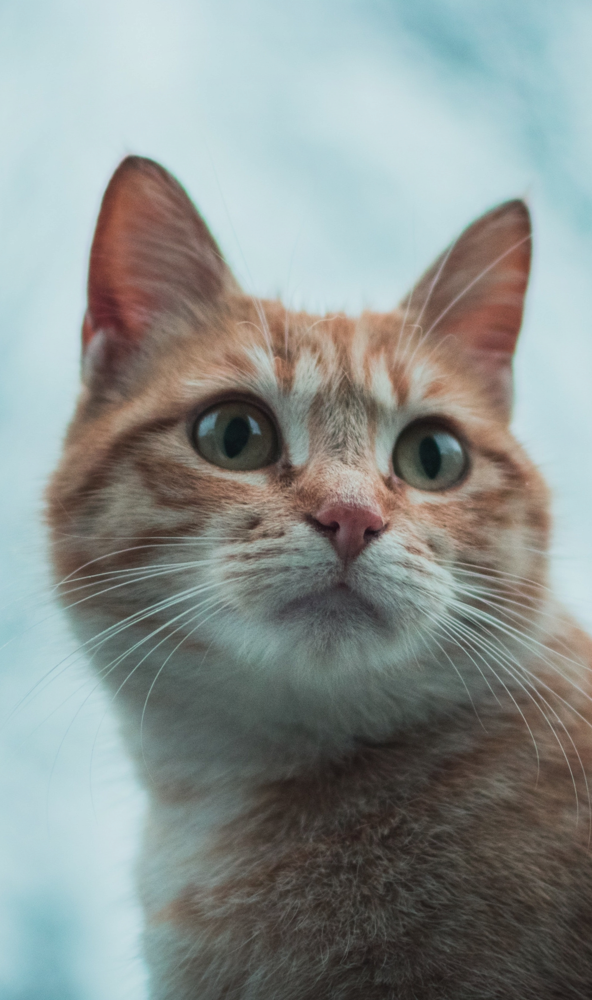

In [4]:
gatito

Para tener su representación en un array podemos utilizar el constructor `np.array` con argumento la imagen.

In [5]:
gatito_np = np.array(gatito)
print(f"Dimension de la imagen gatito: {gatito_np.shape}.\n")
print(f"Al convertir a np.ndarry el tipo de elementos es {gatito_np.dtype}.\n")
print(gatito_np)

Dimension de la imagen gatito: (2160, 1280, 3).

Al convertir a np.ndarry el tipo de elementos es uint8.

[[[179 211 215]
  [179 211 215]
  [179 209 215]
  ...
  [171 201 209]
  [171 201 209]
  [169 199 207]]

 [[181 213 217]
  [181 213 217]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [171 201 209]]

 [[179 211 215]
  [179 211 215]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [173 203 211]]

 ...

 [[125 179 190]
  [123 177 188]
  [129 183 194]
  ...
  [ 41  36  33]
  [ 43  38  35]
  [ 45  40  37]]

 [[127 181 192]
  [125 179 190]
  [127 181 192]
  ...
  [ 43  38  37]
  [ 43  38  37]
  [ 45  40  37]]

 [[125 179 190]
  [123 177 188]
  [123 177 188]
  ...
  [ 49  44  43]
  [ 45  40  37]
  [ 43  38  35]]]


### 1.- Encontrando la imagen oculta

La imagen anterior tiene una imagen oculta, el ejercicio corresponde en descifrarlo. Las instrucciones son las siguientes:

1.1 Crear una lista vacía declarada como `secret_list`.

In [6]:
secret_list = []

1.2 Iterar por cada uno de los canales RGB (`gatito_np.shape[2]`) y en cada iteración:
 * Crear un arreglo temporal llamado `secret_aux` de dos dimensiones, de la misma dimension de pixeles de la imagen `gatito` y que tenga valores enteros, `0` si el valor de la capa de `gatito_np` es par y `1` si es impar. 
  - No iterar por filas y columnas.
  - Utilizar la operación módulo `%`. 
  - En la i-ésima iteración de los canales la capa de `gatito_np` es `gatito_np[:, :, i]`.
        
        
 * Escalar `secret_aux` a valores 0 y 255.
    
 * Cambiar el `dtype` de `secret_aux` a `np.uint8` (utilize el méteodo `astype()`).
            
 * Agregue `secret_aux` a `secret_list`.
    
Al final de la iteración `secret_list` debe tener solo tres arreglos.

**Observación:** recuerde que puede aplicar operaciones directo a un arreglo de numpy.

In [7]:
for c in range(3): #Iterar por cada uno de los canales RGB
    secret_aux = gatito_np[:,:, c] #arreglo temporal de 2 dimensiones 
    secret_aux = secret_aux*225
    secret_aux = secret_aux.astype(np.uint8)
    secret_list.append(secret_aux) #agrega secret_aux a secret_list.
    secret_list

In [8]:
print(f"secret_list tiene {len(secret_list)} elementos")

secret_list tiene 3 elementos


1.3 Crear la variable `secret_np` concatenando horizontalmente los elementos de `secret_list`.

In [9]:
secret_np = np.concatenate((secret_list[0],secret_list[1],secret_list[2]), axis=1)
secret_np.shape

(2160, 3840)

1.4 Crear el objeto `secret_img` utilizando el arreglo `secret_np`, asegurar que los valores estén entre 0 y 255, y que el dtype sea `np.uint8`, con el método `Image.fromarray` con argumento `mode="L"`

In [10]:
np.unique(secret_np)

array([  1,   2,   3,   4,   5,   6,   7,   9,  10,  11,  12,  13,  14,
        16,  17,  18,  19,  20,  21,  22,  24,  25,  26,  27,  28,  29,
        30,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,
        44,  45,  47,  48,  49,  50,  51,  52,  53,  55,  56,  57,  58,
        59,  60,  61,  63,  64,  65,  66,  67,  68,  69,  71,  72,  73,
        74,  75,  76,  78,  79,  80,  81,  82,  83,  84,  86,  87,  88,
        89,  90,  91,  92,  94,  95,  96,  97,  98,  99, 100, 102, 103,
       104, 105, 106, 107, 109, 110, 111, 112, 113, 114, 115, 117, 118,
       119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130, 131, 133,
       134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 145, 146, 148,
       149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 161, 162,
       164, 165, 166, 167, 168, 169, 171, 172, 173, 174, 175, 176, 177,
       179, 180, 181, 182, 183, 184, 185, 187, 188, 189, 190, 191, 192,
       193, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 20

In [11]:
secret_np.dtype

dtype('uint8')

In [12]:
secret_img = Image.fromarray(secret_np,mode='L')

Ahora puedes ver el resultado!

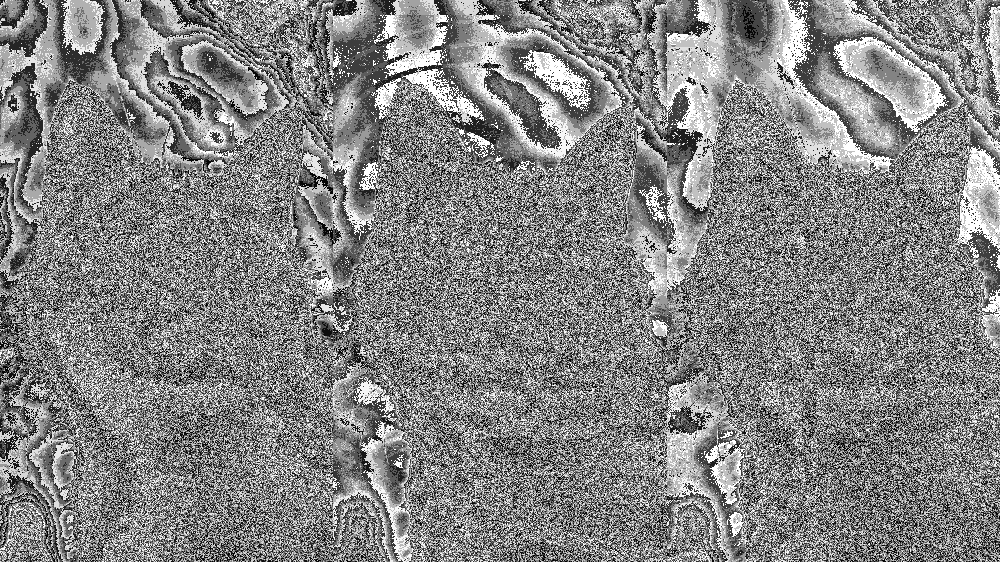

In [13]:
secret_img

### 2.- Escondiendo una nueva imagen

Es tu turno, ahora tu esconderás una imagen. Las instrucciones son las siguientes:

2.1 Selecciona una imagen de 2160 x 3840 pixeles (a.k.a resolución 4k), lo importante es que sea solo en blanco y negro, en la carpeta `images` se disponibiliza como ejemplo la imagen `black_and_white_example.jpg` y crea una variable llamada `my_img` leyendo la imagen seleccionada con `Image.open()`.

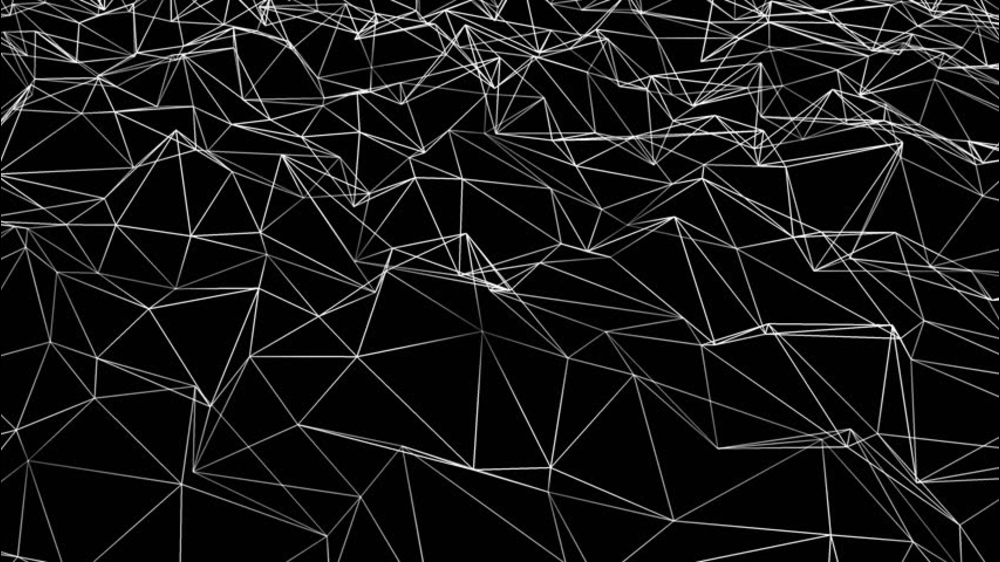

In [14]:
#my_img = Image.open(os.path.join("images", "flower.jpg"))
my_img = Image.open(os.path.join("images", "black_and_white_example.jpg"))
type(my_img)
my_img

2.2 Crea un arreglo llamado `my_img_np` utilizando `my_img` y el método `np.array()`.
    * Es importante que `my_img_np.shape` sea `(2160, 3840)`, es decir, que solo sea de dos dimensiones. Esto porque es una imagen en blanco y negro, no necesitando el modelo RGB.

In [15]:
my_img_np = np.array(my_img)
print(my_img_np.shape)
my_img_np

(2160, 3840)


array([[0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

2.3 Crear la variable `my_img_np_aux` utilizando un _umbral_ con tal de que:
    - 1: Si el valor del pixel es mayor  al _umbral_.
    - 0: Si el valor del pixel es menor o igual al _umbral_.
    - El `dtype` debe ser `np.uint8`.
    - Para `black_and_white_example.jpg` un umbral adecuado es `20`.

In [16]:
umbral = 20
my_img_np_aux = np.zeros(my_img_np.shape)
for i in range(my_img_np.shape[0]):
    np.place(my_img_np[i], my_img_np[i] <= umbral , 0 )
    np.place(my_img_np[i], my_img_np[i] > umbral , 1 )
    my_img_np_aux[i] = my_img_np[i]
my_img_np_aux = my_img_np_aux.astype(np.uint8)
my_img_np_aux.dtype
my_img_np_aux

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

Puedes probar que tan bien quedó la imagen con la siguiente linea. Si crees que no se ve bien, puedes cambiar el _umbral_.

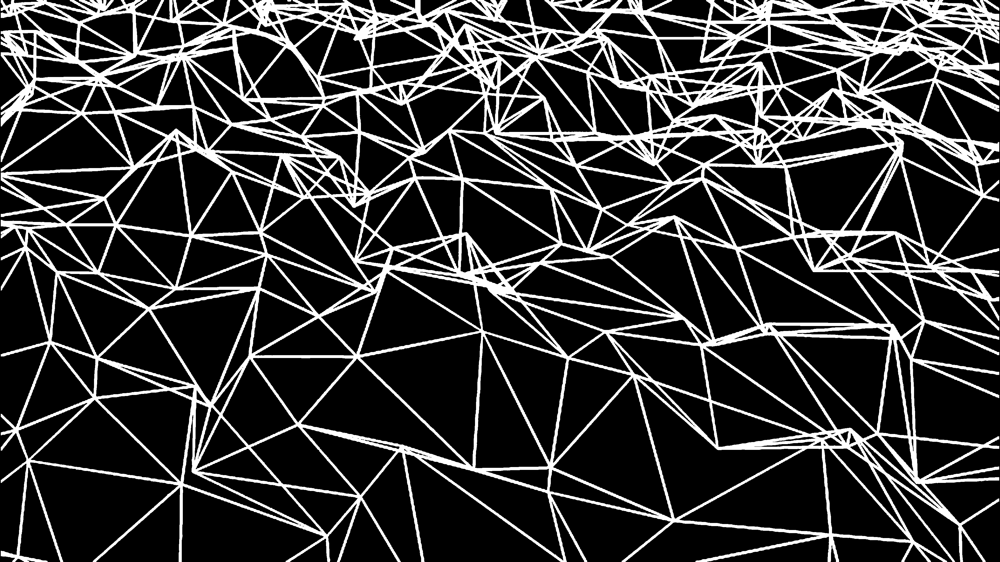

In [17]:
Image.fromarray(my_img_np_aux * 255)

2.4 Dividir la imagen en tres arreglos de tamaño (2160, 1280) y guardarlos en una lista con el nombre `my_img_split`. Hint: Revisa en la documentación de `numpy`.

In [18]:
my_img_split = np.hsplit(my_img_np_aux, 3)

Revisa utilizando la siguiente iteración.

In [19]:
for img_array in my_img_split:
    print(img_array.shape)

(2160, 1280)
(2160, 1280)
(2160, 1280)


2.5 La imagen donde se esconderá tu imagen selecionada está en la carpeta `images` con el nombre `gatito_original.png`, que sospechosamente es de 2160 x 1280 pixeles. Carga la imagen en la variable `cat` y luego crea arreglo `cat_np` utilizando `cat`. Verifica que `cat_np.shape = (2160, 1280, 3)`.

In [20]:
cat = Image.open(os.path.join("images", "gatito_original.png"))
cat_np = np.array(cat)
print(cat_np.shape)
#cat_np

(2160, 1280, 3)


2.6 Convierte todos los valores de `cat_np` a valores pares. Esto lo puedes hacer sumando 1 a cada valor de arreglo si es impar

In [21]:
cat_np+=cat_np%2 #si el n° es par el resto será cero y si es impar sera 1 asi nos aseguramos que todos los valores sean par
cat_np.shape

(2160, 1280, 3)

2.7 Itera por canal RGB de `cat_np` y en cada capa suma los valores de uno de los arreglos de `my_img_split`.

In [22]:
for channel in range(3):
    cat_np[:,:,channel] += my_img_split[channel]

2.8 Crea una variable llamada `cat_secret_im` con `Image.fromarray` y la variable `cat_np` (que ya ha sido modificada). Luego guarda la imagen en la carpeta `images` con el nombre `my_secret.png`.

In [23]:
cat_secret_im = Image.fromarray(cat_np)
cat_secret_im.save(os.path.join("images", "my_secret.png"))

2.9 Crea una función llamada `imagenception()` que como argumento tenga la ruta de la imagen que quieres descifrar y que descifre la imagen secreta recientemente creada. Hint: Utiliza todos los pasos de la primera parte. 

In [24]:
def imagenception(filepath):
    im = Image.open(filepath)
    im_np = np.array(im)
    secret_list= []
    for i in range(3):
        secret_aux=np.zeros((im_np.shape[0],im_np.shape[1]))
        secret_aux=(im_np[:,:,i]%2)*250
        secret_aux.astype(np.uint8)
        secret_list.append(secret_aux)
   

    secret_np = np.concatenate((secret_list[0],secret_list[1],secret_list[2]),axis=1)
    secret_img = Image.fromarray(secret_np)
    return secret_img

In [ ]:
my_secret_img = imagenception(os.path.join("images", "my_secret.png"))
my_secret_img

## II.- Analizando la Felicidad

<img src="https://static01.nyt.com/images/2019/09/29/opinion/sunday/29HolsonStill/29HolsonStill-popup.jpg" width="480" height="360" align="center"/>

Este ejercicio es netamente análisis de datos, tratando de abarcar problemas típicos como la lectura de datos, corrección de errores, métricas agrupadas, unión de datos, etc. Utilizaremos un conjunto de datos llamado __World Happiness Report__ disponible en el siguiente [link](https://www.kaggle.com/unsdsn/world-happiness), de donde se puede obtener información al respecto.

#### Context
The World Happiness Report is a landmark survey of the state of global happiness. The first report was published in 2012, the second in 2013, the third in 2015, and the fourth in the 2016 Update. The World Happiness 2017, which ranks 155 countries by their happiness levels, was released at the United Nations at an event celebrating International Day of Happiness on March 20th. The report continues to gain global recognition as governments, organizations and civil society increasingly use happiness indicators to inform their policy-making decisions. Leading experts across fields – economics, psychology, survey analysis, national statistics, health, public policy and more – describe how measurements of well-being can be used effectively to assess the progress of nations. The reports review the state of happiness in the world today and show how the new science of happiness explains personal and national variations in happiness.

#### Content
The happiness scores and rankings use data from the Gallup World Poll. The scores are based on answers to the main life evaluation question asked in the poll. This question, known as the Cantril ladder, asks respondents to think of a ladder with the best possible life for them being a 10 and the worst possible life being a 0 and to rate their own current lives on that scale. The scores are from nationally representative samples for the years 2013-2016 and use the Gallup weights to make the estimates representative. The columns following the happiness score estimate the extent to which each of six factors – economic production, social support, life expectancy, freedom, absence of corruption, and generosity – contribute to making life evaluations higher in each country than they are in Dystopia, a hypothetical country that has values equal to the world’s lowest national averages for each of the six factors. They have no impact on the total score reported for each country, but they do explain why some countries rank higher than others.


### 2.1 Lectura de datos

In [26]:
# libraries
import numpy as np
import os
import pandas as pd
pd.set_option("display.max_columns", 999)  # Permite mostrar hasta 999 columnas de un DataFrame en Jupyter.

En la carpeta `data/world-happiness` se disponen de tres archivos, uno por cada reporte anual (años 2015, 2016 y 2017). No es de sorprender que envíen un archivo por año (podría ser mensual, semestral, etc.), lo imortante es ser capaces de leer una cantidad __variable__ de archivos al mismo tiempo. Una buena práctica es crear un diccionario de dataframes.

In [27]:
# Comprehension dictionary
df_dict = {
    year: pd.read_csv(os.path.join("data", "world-happiness", f"{year}.csv"))
    for year in [2015, 2016, 2017]
}

Por ejemplo, se puede acceder al DataFrame asociado al archivo `data/world-happiness/2016.csv` de la siguiente manera:

In [28]:
df_dict[2016].head()

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596


Una pequeña descripción de las columnas

* `Country` Name of the country.
* `Region` Region the country belongs to.
* `Happiness Rank` Rank of the country based on the Happiness Score.
* `Happiness Score` A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."
* `Standard Error` The standard error of the happiness score.
* `Economy (GDP per Capita)` The extent to which GDP contributes to the calculation of the Happiness Score.
* `Family` The extent to which Family contributes to the calculation of the Happiness Score
* `Health (Life Expectancy)` The extent to which Life expectancy contributed to the calculation of the Happiness Score
* `Freedom` The extent to which Freedom contributed to the calculation of the Happiness Score.
* `Trust (Government Corruption)` The extent to which Perception of Corruption contributes to Happiness Score.
* `Generosity` The extent to which Generosity contributed to the calculation of the Happiness Score.
* `Dystopia Residual` The extent to which Dystopia Residual contributed to the calculation of the Happiness Score.

Notar que los conjuntos de datos no poseen las mismas columnas, por lo tanto, solo se trabajarán con las columnas en común y posteriormente agregaremos el año con tal de concatenar los tres conjuntos.

In [29]:
from functools import reduce
intersection_columns = reduce(np.intersect1d, [df_i.columns.values for df_i in df_dict.values()]).tolist()
print(intersection_columns)

['Country', 'Dystopia Residual', 'Economy (GDP per Capita)', 'Family', 'Freedom', 'Generosity', 'Happiness Rank', 'Happiness Score', 'Health (Life Expectancy)', 'Trust (Government Corruption)']


Explica con tus palabras las operaciones que se realizaron para obtener la variable `intersection_columns`.

__Respuesta:__  Se crea una lista vacia con 3 arrays, donde en las columnas se tienen los 3 dataframes por año, usamos np.intersect1d con la función reduce(), donde np.intersect1d encuentra la intersección de arrays, la cuál se aplicada en una iteración en la lista de arrays, asi finalmente pasamos el array a lista con tolist()

### 2.2 Concatenación y procesado

Define el DataFrame `happiness` tal que:

* Sea la concatenación de los dataframes de `df_dict`
    - Nota que en la documentación de `pd.concat` puedes entregar como argumento directamente un diccionario.
    - No ordenes los _axis_ (ver documentación).
    - Los nombres de los _levels_ para los multi-index resultante deben ser `["Year", "drop_me"]`.
* Aplica el método `drop_level` con tal de eliminar el nivel del multi-index llamado `drop_me`.
* Resetea los índices.
* Selecciona solo las columnas de la lista `intersection_columns`.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (`_`) y elimina los paréntesis.


In [58]:
happiness = (
    pd.concat(df_dict)
    .loc[:, intersection_columns]
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
happiness.head()

country  dystopia_residual  economy_(gdp_per_capita)   family  \
2015 0  Switzerland            2.51738                   1.39651  1.34951   
     1      Iceland            2.70201                   1.30232  1.40223   
     2      Denmark            2.49204                   1.32548  1.36058   
     3       Norway            2.46531                   1.45900  1.33095   
     4       Canada            2.45176                   1.32629  1.32261   

        freedom  generosity  happiness_rank  happiness_score  \
2015 0  0.66557     0.29678               1            7.587   
     1  0.62877     0.43630               2            7.561   
     2  0.64938     0.34139               3            7.527   
     3  0.66973     0.34699               4            7.522   
     4  0.63297     0.45811               5            7.427   

        health_(life_expectancy)  trust_(government_corruption)  
2015 0                   0.94143                        0.41978  
     1                   0.94784                        0.14145  
     2                   0.87464                        0.48357  
     3                   0.88521                        0.36503  
     4                   0.90563                        0.32957

#### 2.3 Análisis

Como siempre, partimos con un análisis descriptivo simple.

In [31]:
happiness.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,470,166,Denmark,3,,,,,,,
dystopia_residual,470.0,,,,2.092717,0.565772,0.32858,1.737975,2.09464,2.455575,3.83772
economy_(gdp_per_capita),470.0,,,,0.92783,0.415584,0.0,0.605292,0.995439,1.252443,1.870766
family,470.0,,,,0.990347,0.318707,0.0,0.793,1.025665,1.228745,1.610574
freedom,470.0,,,,0.402828,0.150356,0.0,0.297615,0.418347,0.51685,0.66973
generosity,470.0,,,,0.242241,0.131543,0.0,0.152831,0.22314,0.315824,0.838075
happiness_rank,470.0,,,,78.829787,45.281408,1.0,40.0,79.0,118.0,158.0
happiness_score,470.0,,,,5.370728,1.136998,2.693,4.509,5.2825,6.23375,7.587
health_(life_expectancy),470.0,,,,0.579968,0.240161,0.0,0.402301,0.630053,0.768298,1.02525
trust_(government_corruption),470.0,,,,0.13479,0.111313,0.0,0.059777,0.099502,0.173161,0.55191


¿Cuántos países no tienen mediciones de felicidad en los tres años del estudio? ¿Cuáles son?

In [32]:

c2015= set(happiness['country'][2015].unique())
c2016= set(happiness['country'][2016].unique())
c2017= set(happiness['country'][2017].unique())

c2015.union(c2016).union(c2017)-(c2017&c2016&c2015)

{'Belize',
 'Central African Republic',
 'Comoros',
 'Djibouti',
 'Hong Kong',
 'Hong Kong S.A.R., China',
 'Laos',
 'Lesotho',
 'Mozambique',
 'Namibia',
 'Oman',
 'Puerto Rico',
 'Somalia',
 'Somaliland Region',
 'Somaliland region',
 'South Sudan',
 'Suriname',
 'Swaziland',
 'Taiwan',
 'Taiwan Province of China'}

__Respuesta:__  20 paises, los cuales se presentan arriba

Note que la lista de países proveniente de la pregunta anterior tiene errores de consistencia, por ejemplo están los registros de `Hong Kong` y `Hong Kong S.A.R., China` que escencialmente son el mismo. Lo mismo ocurre con `Taiwan` y `Somaliland Region`.

Modifique la columna `country` del dataframe `happiness` con tal de reparar los errores de `Hong Kong`, `Taiwan` y `Somaliland Region`.

In [33]:
bad_country_names_dict = {"Hong Kong S.A.R., China": "Hong Kong", "Somaliland region":"Somalia", 
                          "Somaliland Region":"Somalia", "Taiwan Province of China": "Taiwan"}
happiness = happiness.assign(country= lambda x: x['country'].replace(bad_country_names_dict))

Luego de la modificación, ¿Cuántos países no tienen mediciones en los tres años de estudio?

In [34]:

c2015_c= set(happiness['country'][2015].unique())
c2016_c= set(happiness['country'][2016].unique())
c2017_c= set(happiness['country'][2017].unique())

c2015_c.union(c2016_c).union(c2017_c)-(c2017_c&c2016_c&c2015_c)

{'Belize',
 'Central African Republic',
 'Comoros',
 'Djibouti',
 'Laos',
 'Lesotho',
 'Mozambique',
 'Namibia',
 'Oman',
 'Puerto Rico',
 'South Sudan',
 'Suriname',
 'Swaziland'}

__Respuesta:__  Ahora se tienen 13 paises

Pivotea el dataframe `happines` tal que los índices sean los años, las columnas los países y el valor su `happiness_score`. LLena los valores nulos con un _string_ vacío `""`. Un país no puede tener más de un registro por año, por lo que puedes utilizar directamente el médoto `pd.DataFrame.pivot()`.


In [35]:
# Se crean 3 listas con los años para agregarla al dataframe

list_2015=[]
list_2016=[]
list_2017=[]
for i in range(df_dict[2015].shape[0]):
    list_2015.append(2015)
for i in range(df_dict[2016].shape[0]):
    list_2015.append(2016)
for i in range(df_dict[2017].shape[0]):
    list_2015.append(2017)
list_tot= list_2015 + list_2016 + list_2017
happiness['year']=list_tot

In [36]:
#presentamos la tabla de contenidos de pais-año de puntaje de felicidad
h_piv_score= happiness.pivot_table(index='year' , columns="country", values="happiness_score", fill_value='')
h_piv_score

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,3.575,4.959,5.605,4.033,6.574,4.350,7.284,7.200,5.212,5.960,4.694,5.813,6.937,,3.340,5.253,5.890,4.949,4.332,6.983,4.218,3.587,2.905,3.819,4.252,7.427,3.678,3.667,6.670,5.140,6.477,3.956,3.989,4.517,7.226,5.759,5.689,6.505,7.527,4.369,4.885,5.975,4.194,6.130,5.429,4.512,7.406,6.575,3.896,4.297,6.750,4.633,4.857,6.123,3.656,4.518,4.788,5.474,4.800,7.561,4.565,5.399,4.686,4.677,6.940,7.278,5.948,3.655,5.709,5.987,5.192,5.855,4.419,5.589,6.295,5.286,4.876,5.098,4.839,4.898,4.571,5.754,5.833,6.946,5.007,3.681,4.292,5.770,3.995,6.302,4.436,5.477,7.187,5.889,4.874,5.192,5.013,4.971,4.307,,4.514,7.378,7.286,5.828,3.845,5.268,5.695,7.522,6.853,5.194,4.715,6.786,5.878,5.824,5.073,5.791,5.102,,6.611,5.124,5.716,3.465,6.411,3.904,5.123,4.507,6.798,5.995,5.848,5.0570,4.642,5.984,,6.329,4.271,4.550,6.269,4.867,7.364,7.587,3.006,6.298,4.786,3.781,6.455,2.839,6.168,4.739,5.332,5.548,3.931,4.681,6.901,6.867,7.119,6.485,6.003,6.810,5.360,4.077,5.129,4.610
2016,3.360,4.655,6.355,3.866,6.650,4.360,7.313,7.119,5.291,6.218,4.643,5.802,6.929,5.956,3.484,5.196,5.822,5.163,3.974,6.952,4.217,3.739,2.905,3.907,4.513,7.404,,3.763,6.705,5.245,6.481,3.956,4.236,4.272,7.087,5.488,5.546,6.596,7.526,,5.155,5.976,4.362,6.068,5.517,4.508,7.413,6.478,4.121,4.252,6.994,4.276,5.033,6.324,3.607,4.028,4.871,5.458,5.145,7.501,4.404,5.314,4.813,4.575,6.907,7.267,5.977,3.916,5.510,5.921,5.303,5.919,4.356,5.401,6.239,5.185,4.876,5.560,5.129,,3.622,5.615,5.813,6.871,5.121,3.695,4.156,6.005,4.073,6.488,4.201,5.648,6.778,5.897,4.907,5.161,5.151,,4.395,4.574,4.793,7.339,7.334,5.992,3.856,4.875,5.771,7.498,,5.132,4.754,6.701,5.538,5.743,5.279,5.835,5.123,7.039,6.375,5.528,5.856,3.515,6.379,4.219,5.177,4.635,6.739,6.078,5.768,5.2485,4.459,5.835,3.832,6.361,4.415,4.139,6.269,,7.291,7.509,3.069,6.379,4.996,3.666,6.474,3.303,6.168,5.045,5.389,5.658,3.739,4.324,6.573,6.725,7.104,6.545,5.987,6.084,5.061,3.724,4.795,4.193
2017,3.794,4.644,5.872,3.795,6.599,4.376,7.284,7.006,5.234,6.087,4.608,5.569,6.891,5.956,3.657,5.011,5.823,5.182,3.766,6.635,4.714,4.032,2.905,4.168,4.695,7.316,2.693,3.936,6.652,5.273,6.357,,4.291,4.280,7.079,5.293,5.621,6.609,7.522,,5.230,6.008,4.735,6.003,5.611,4.460,7.469,6.442,4.465,4.286,6.951,4.120,5.227,6.454,3.507,3.603,5.181,5.472,5.324,7.504,4.315,5.262,4.692,4.497,6.977,7.213,5.964,4.180,5.311,5.920,5.336,5.819,4.553,5.279

In [37]:
#presentamos la tabla de contenidos de pais-año de rango de felicidad
h_piv_rank= happiness.pivot_table(index='year' , columns="country", values="happiness_rank", fill_value='')
h_piv_rank

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,153.0,95.0,68.0,137.0,30.0,127.0,10.0,13.0,80.0,49.0,109.0,59.0,19.0,,155.0,79.0,51.0,96.0,128.0,16.0,134.0,152.0,157.0,145.0,133.0,5.0,148.0,149.0,27.0,84.0,33.0,140.0,139.0,120.0,12.0,62.0,67.0,31.0,3.0,126.0,98.0,48.0,135.0,42.0,73.0,122.0,6.0,29.0,143.0,130.0,26.0,114.0,102.0,43.0,150.0,119.0,105.0,72.0,104.0,2.0,117.0,74.0,110.0,112.0,18.0,11.0,50.0,151.0,65.0,46.0,82.0,54.0,125.0,69.0,39.0,77.0,99.0,89.0,103.0,97.0,116.0,63.0,56.0,17.0,93.0,147.0,131.0,61.0,138.0,37.0,124.0,71.0,14.0,52.0,100.0,82.0,92.0,94.0,129.0,,121.0,7.0,9.0,57.0,144.0,78.0,66.0,4.0,22.0,81.0,108.0,25.0,53.0,58.0,90.0,60.0,88.0,,28.0,86.0,64.0,154.0,35.0,142.0,87.0,123.0,24.0,45.0,55.0,91.0,113.0,47.0,,36.0,132.0,118.0,40.0,101.0,8.0,1.0,156.0,38.0,106.0,146.0,34.0,158.0,41.0,107.0,76.0,70.0,141.0,111.0,20.0,21.0,15.0,32.0,44.0,23.0,75.0,136.0,85.0,115.0
2016,154.0,109.0,38.0,141.0,26.0,121.0,9.0,12.0,81.0,42.0,110.0,61.0,18.0,52.0,153.0,84.0,59.0,87.0,137.0,17.0,129.0,145.0,157.0,140.0,114.0,6.0,,144.0,24.0,83.0,31.0,138.0,127.0,125.0,14.0,74.0,69.0,27.0,1.0,,89.0,51.0,120.0,46.0,72.0,115.0,5.0,32.0,134.0,126.0,16.0,124.0,99.0,39.0,151.0,136.0,104.0,75.0,91.0,3.0,118.0,79.0,105.0,112.0,19.0,11.0,50.0,139.0,73.0,53.0,80.0,54.0,122.0,77.0,41.0,85.0,102.0,68.0,93.0,,150.0,67.0,60.0,20.0,95.0,148.0,132.0,47.0,135.0,30.0,130.0,66.0,21.0,55.0,101.0,88.0,90.0,,119.0,113.0,107.0,7.0,8.0,48.0,142.0,103.0,62.0,4.0,,92.0,108.0,25.0,70.0,64.0,82.0,57.0,94.0,15.0,36.0,71.0,56.0,152.0,34.0,128.0,86.0,111.0,22.0,45.0,63.0,86.5,116.0,57.0,143.0,37.0,117.0,133.0,40.0,,10.0,2.0,156.0,34.0,100.0,149.0,33.0,155.0,43.0,98.0,78.0,65.0,145.0,123.0,28.0,23.0,13.0,29.0,49.0,44.0,96.0,147.0,106.0,131.0
2017,141.0,109.0,53.0,140.0,24.0,121.0,10.0,13.0,85.0,41.0,110.0,67.0,17.0,50.0,143.0,97.0,58.0,90.0,142.0,22.0,105.0,134.0,154.0,129.0,107.0,7.0,155.0,137.0,20.0,79.0,36.0,,124.0,126.0,12.0,77.0,65.0,23.0,2.0,,86.0,44.0,104.0,45.0,66.0,119.0,5.0,31.0,118.0,125.0,16.0,131.0,87.0,29.0,149.0,145.0,91.0,71.0,75.0,3.0,122.0,81.0,108.0,117.0,15.0,11.0,48.0,128.0,76.0,51.0,74.0,60.0,112.0,78.0,39.0,98.0,,54.0,88.0,139.0,148.0,68.0,52.0,18.0,92.0,144.0,136.0,42.0,127.0,27.0,123.0,64.0,25.0,56.0,100.0,83.0,84.0,113.0,114.0,111.0,99.0,6.0,8.0,43.0,135.0,95.0,61.0,1.0,,80.0,103.0,30.0,70.0,63.0,72.0,46.0,89.0,,35.0,57.0,49.0,151.0,37.0,115.0,73.0,106.0,26.0

¿Qué información podrías sacar rápidamente de esta tabla pivoteada? ¿Podrías decir que siempre es útil pivotear una tabla?

__Respuesta:__  De las tablas podemos sacar la informacion de que paises no presentan mediaciones en ciertos años, ademas de cual fue le happiness_score y happiness_rank de cada pais por año

En promedio, ¿Cuáles son los tres países con el mejor ranking de felicidad?

In [38]:
h_piv_rank.mean().nsmallest(3)

country
Denmark        2.000000
Switzerland    2.333333
Iceland        2.666667
dtype: float64

__Respuesta:__  Los tres paises con mejor ranking de felicidad son:

1.- Denmark con ranking 2

2.- Switzerland con rankin 2,33

3.- Iceland con ranking 2,66



En promedio, ¿Cuáles son los tres países con el mayor _score_ de felicidad? ¿Son distintos a los con mejor ranking en promedio?

In [39]:
h_piv_score.mean().nlargest(3)

country
Switzerland    7.530
Denmark        7.525
Iceland        7.522
dtype: float64

__Respuesta:__  Los tres paises con mejor score de felicidad son:

1.- Switzerland con score 7.530

2.- Denmark con score 7.25

3.- Iceland con score 7.522

Son los mismos paises pero en distinto orden, se intercambia el primero con el segundo

Calcula el promedio anual de todas las columnas factores de felicidad, es decir, todas las variables numéricas excepto `happiness_score` y `happiness_rank`.

In [40]:
happ= happiness.drop(['happiness_score','happiness_rank'],axis=1).groupby(['year']).mean()
happ

,dystopia_residual,economy_(gdp_per_capita),family,freedom,generosity,health_(life_expectancy),trust_(government_corruption)
year,,,,,,,
2015,2.098977,0.846137,0.991046,0.428615,0.237296,0.630259,0.143422
2016,2.325807,0.953880,0.793621,0.370994,0.242635,0.557619,0.137624
2017,1.850238,0.984718,1.188898,0.408786,0.246883,0.551341,0.123120


Respecto al cálculo anterior, para cada uno de los años, ¿Cuál es el factor que más contribuye (en promedio) al _score_ de la felicidad y en qué medida?

In [41]:
## FIX ME ##

__Resuesta:__

__"happiness_score"__ es la suma de todos los otros factores, por lo que en promedio el factor mas influyente es __"dystopia_residual"__ para todos los años.
* 2015:  dystopia_residual
* 2016:  dystopia_residual
* 2017:  dystopia_residual

### 2.4 Agregando más datos

A continuación, agregaremos un nuevo conjunto de datos, el que contiene estadísticas de suicidio por años, países y rangos etáreos. Se encuentra disponible en el siguiente [link](https://www.kaggle.com/russellyates88/suicide-rates-overview-1985-to-2016).

In [42]:
suicide = pd.read_csv(os.path.join("data", "suicide_rates.csv"))
suicide.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


La mayoría de las columnas son autoexplicativas.
* `country`
* `year`
* `sex`
* `age`
* `suicides_no`
* `population`
* `suicides/100k pop`
* `country-year`
* `HDI for year` Human Development Index
* `gdp_for_year ($)` Gross Domestic Product
* `gdp_per_capita ($)`
* `generation` based on age grouping average

Un poco de estadística descriptiva.

In [43]:
suicide.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,27820,101,Mauritius,382,,,,,,,
year,27820.0,,,,2001.258375,8.469055,1985.0,1995.0,2002.0,2008.0,2016.0
sex,27820,2,male,13910,,,,,,,
age,27820,6,55-74 years,4642,,,,,,,
suicides_no,27820.0,,,,242.574407,902.047917,0.0,3.0,25.0,131.0,22338.0
population,27820.0,,,,1844793.617398,3911779.441756,278.0,97498.5,430150.0,1486143.25,43805214.0
suicides/100k pop,27820.0,,,,12.816097,18.961511,0.0,0.92,5.99,16.62,224.97
country-year,27820,2321,Argentina2009,12,,,,,,,
HDI for year,8364.0,,,,0.776601,0.093367,0.483,0.713,0.779,0.855,0.944
gdp_for_year ($),27820,2321,"45,519,034,244",12,,,,,,,


Crea un nuevo DataFrame llamado suicide_agg siguiendo las siguientes instrucciones:

* Agrupa por país y año.
* Suma la población y el número de suicidios.
* Resetea los índices.
* Agrega una nueva columna llamada `suicides_ratio_100k` formada por la división de `suicides_no` y `population`, para posteriormente muliplicarla por 100,000.
* Agrega una nuevale columna llamada `suicides_rank` similar a `happiness_rank`, es decir, que asigne un orden __por año__ a cada país según la columna `suicides_ratio_100k` tal que el rank 1 corresponda al que tenga mayor `suicides_ratio_100k`. Hint: Usa el método `rank()`.

In [44]:
# Es posible hacer todas las operaciones encadenadas!
suicides_agg = (
    suicide.groupby([suicide['country'], suicide['year']])
    .agg(
        {'suicides_no': 'sum' , 'population':'sum'}
    )
    .reset_index()
    .assign(
        suicides_ratio_100k= lambda x: x['suicides_no']/x['population'],
        suicides_rank= lambda x: x['suicides_ratio_100k'].rank(ascending=False)
    )
)

suicides_agg

,country,year,suicides_no,population,suicides_ratio_100k,suicides_rank
0,Albania,1987,73,2709600,0.000027,1999.0
1,Albania,1988,63,2764300,0.000023,2052.0
2,Albania,1989,68,2803100,0.000024,2038.0
3,Albania,1992,47,2822500,0.000017,2131.0
4,Albania,1993,73,2807300,0.000026,2010.0
...,...,...,...,...,...,...
2316,Uzbekistan,2010,1464,25651783,0.000057,1653.0
2317,Uzbekistan,2011,1640,25978049,0.000063,1592.0
2318,Uzbekistan,2012,1835,26381830,0.000070,1516.0
2319,Uzbekistan,2013,1950,26838924,0.000073,1477.0


Crea un nuevo DataFrame con el nombre `hap_sui` al unir `happiness` y `suicides_agg` tal que coincidan país y año, quédate con solo los registros que coincidan en ambas DataFrames.

In [45]:
hap_sui = pd.merge(happiness,suicides_agg,on=['country','year'])
hap_sui.head()

,country,dystopia_residual,economy_(gdp_per_capita),family,freedom,generosity,happiness_rank,happiness_score,health_(life_expectancy),trust_(government_corruption),year,suicides_no,population,suicides_ratio_100k,suicides_rank
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015,1073,7892502,0.000136,793.0
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015,40,308554,0.000130,868.0
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015,564,5383060,0.000105,1124.0
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015,590,4882909,0.000121,967.0
4,Finland,2.61955,1.29025,1.31826,0.64169,0.23351,6,7.406,0.88911,0.41372,2015,731,5181797,0.000141,739.0


¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank`?

In [46]:
hap_sui.loc[:, ["happiness_rank", "suicides_rank"]].corr()

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.113848
suicides_rank,0.113848,1.000000


__Respuesta:__  notemos que los valores son muy cercanos a cero, asi podemos concluir que no existe correlacion lineal entre las variables

¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank` por cada año?

In [47]:
hap_sui_2015= hap_sui[hap_sui['year']==2015]
hap_sui_2016= hap_sui[hap_sui['year']==2016]


In [48]:

hap_sui_2015.loc[:, ["happiness_rank", "suicides_rank"]].corr()


,happiness_rank,suicides_rank
happiness_rank,1.000000,0.122542
suicides_rank,0.122542,1.000000


In [49]:
hap_sui_2016.loc[:, ["happiness_rank", "suicides_rank"]].corr()

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.137999
suicides_rank,0.137999,1.000000


__Respuesta:__  Notemos que en ninguno d los dos casos se observa correlación lineal entre las variables.

¿La respuesta de las dos preguntas anteriores cambia si se utilizan las variables `happiness_score` y `suicides_ratio_100k`?

In [50]:
hap_sui_2015.loc[:, ["happiness_score", "suicides_ratio_100k"]].corr()

,happiness_score,suicides_ratio_100k
happiness_score,1.000000,0.035262
suicides_ratio_100k,0.035262,1.000000


In [51]:

hap_sui_2016.loc[:, ["happiness_score", "suicides_ratio_100k"]].corr()

,happiness_score,suicides_ratio_100k
happiness_score,1.000000,0.025924
suicides_ratio_100k,0.025924,1.000000


### III.- LearnPlatform

<img src="https://iltpp.org/wp-content/uploads/2020/11/LearnPlatform.png" width="480" height="360" align="center"/>

### Introducción

Nelson Mandela creía que la educación era el arma más poderosa para cambiar el mundo. Pero no todos los estudiantes tienen las mismas oportunidades de aprender. Es necesario promulgar políticas y planes efectivos para que la educación sea más equitativa, y tal vez su innovador análisis de datos ayude a revelar la solución.

La investigación actual muestra que los resultados educativos están lejos de ser equitativos. El desequilibrio se vio agravado por la pandemia de COVID-19. Existe una necesidad urgente de comprender y medir mejor el alcance y el impacto de la pandemia en estas inequidades.

La empresa de tecnología educativa LearnPlatform se fundó en 2014 con la misión de ampliar el acceso equitativo a la tecnología educativa para todos los estudiantes y profesores. Los distritos y estados utilizan el sistema integral de efectividad de la tecnología educativa de LearnPlatform para mejorar continuamente la seguridad, la equidad y la efectividad de su tecnología educativa. LearnPlatform lo hace generando una base de evidencia de lo que está funcionando y promulgándola en beneficio de los estudiantes, los profesores y los presupuestos.

En esta competencia de análisis, trabajará para descubrir tendencias en el aprendizaje digital. Logre esto con un análisis de datos sobre cómo el compromiso con el aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a la banda ancha y las políticas y eventos a nivel estatal / nacional. Luego, envíe un notebook de Kaggle para proponer su mejor solución a estas desigualdades educativas.

Sus presentaciones informarán las políticas y prácticas que cierran la brecha digital. Con una mejor comprensión de las tendencias de aprendizaje digital, puede ayudar a revertir la pérdida de aprendizaje a largo plazo entre los más vulnerables de Estados Unidos, haciendo que la educación sea más equitativa.

### Planteamiento del problema
La pandemia COVID-19 ha interrumpido el aprendizaje de más de 56 millones de estudiantes en los Estados Unidos. En la primavera de 2020, la mayoría de los gobiernos estatales y locales de los EE. UU. Cerraron las instituciones educativas para detener la propagación del virus. En respuesta, las escuelas y los maestros han intentado llegar a los estudiantes de forma remota a través de herramientas de aprendizaje a distancia y plataformas digitales. Hasta el día de hoy, las preocupaciones sobre la exacerbación de la brecha digital y la pérdida de aprendizaje a largo plazo entre los estudiantes más vulnerables de Estados Unidos continúan creciendo.

### Desafío
Los estudiantes deben explorar (1) el estado del aprendizaje digital en 2020 y (2) cómo la participación del aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a banda ancha y las políticas y eventos a nivel estatal/nacional.

Le recomendamos que oriente el análisis con preguntas relacionadas con los temas descritos anteriormente (en negrita). A continuación se muestran algunos ejemplos de preguntas que se relacionan con el planteamiento de nuestro problema:

* ¿Cuál es el panorama de la conectividad y el compromiso digitales en 2020?
* ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?
* ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?
* ¿Cómo se relaciona la participación de los estudiantes con las plataformas de aprendizaje en línea con las diferentes geografías? ¿Contexto demográfico (por ejemplo, raza/etnia, ESL, discapacidad de aprendizaje)? Contexto de aprendizaje? ¿Estatus socioeconómico?
* ¿Se correlacionan ciertas intervenciones, prácticas o políticas estatales (por ejemplo, estímulo, reapertura, moratoria de desalojo) con el aumento o la disminución de la participación en línea?

### Evaluación


#### Claridad 

* ¿El autor presentó un hilo claro de preguntas o temas que motivaron su análisis?
* ¿El autor documentó por qué/cómo se eligió y utilizó un conjunto de métodos para su análisis?
* ¿Está documentado el notebook de una manera que sea fácilmente reproducible (p. Ej., Código, fuentes de datos adicionales, citas)?
* ¿El notebook contiene visualizaciones de datos claras que ayuden a comunicar de manera eficaz los hallazgos del autor tanto a expertos como a no expertos?

#### Precisión 

* ¿El autor procesó los datos (por ejemplo, fusionando) y/o fuentes de datos adicionales con precisión?
* ¿La metodología utilizada en el análisis es apropiada y razonable?
* ¿Son razonables y convincentes las interpretaciones basadas en el análisis y la visualización?

#### Creatividad 

* ¿El notebook ayuda al lector a aprender algo nuevo o lo desafía a pensar de una manera nueva?
* ¿El notebook aprovecha métodos novedosos y/o visualizaciones que ayudan a revelar información a partir de datos y/o comunicar hallazgos?
* ¿El autor utilizó fuentes de datos públicas adicionales en su análisis?

#### Hints

* Esto corresponde a un desafio de Kaggle ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/overview/description)).
* La descripción de las columnas, lo pueden encontrar en el siguiente [link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/data).
* Los datos del desafio se encuentran en el siguiente [link](https://drive.google.com/drive/folders/15t3gGwGNazuW5Zs4Mj_9_d2sMJdJg7qo).
* A modo de inspiración, pueden ocupar algunos gráficos de otros participantes del desafío ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/code)).

In [83]:
# libraries
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [84]:
# read data

## products dataset
path = 'data/learnplatform-covid19-impact-on-digital-learning/'
products_df = pd.read_csv(path + "products_info.csv")
products_df.columns = [x.lower().replace(' ','_') 
for x in products_df.columns]

In [85]:
products_df #revisamos el bigdata de products

,lp_id,url,product_name,provider/company_name,sector(s),primary_essential_function
0,13117,https://www.splashmath.com,SplashLearn,StudyPad Inc.,PreK-12,LC - Digital Learning Platforms
1,66933,https://abcmouse.com,ABCmouse.com,"Age of Learning, Inc",PreK-12,LC - Digital Learning Platforms
2,50479,https://www.abcya.com,ABCya!,"ABCya.com, LLC",PreK-12,"LC - Sites, Resources & Reference - Games & Si..."
3,92993,http://www.aleks.com/,ALEKS,McGraw-Hill PreK-12,PreK-12; Higher Ed,LC - Digital Learning Platforms
4,73104,https://www.achieve3000.com/,Achieve3000,Achieve3000,PreK-12,LC - Digital Learning Platforms
...,...,...,...,...,...,...
367,88065,https://dochub.com/,DocHub,DocHub,PreK-12; Higher Ed; Corporate,SDO - Other
368,37805,http://google.com/slides/about/,Google Slides,Google LLC,PreK-12; Higher Ed; Corporate,LC - Content Creation & Curation
369,32555,http://www.innersloth.com/gameAmongUs.php,Among Us,InnerSloth,PreK-12; Higher Ed,"LC - Sites, Resources & Reference - Games & Si..."
370,87841,http://edpuzzle.com,Edpuzzle - Free (Basic Plan),EDpuzzle Inc.,NaN,NaN


In [67]:
#filtro la lista eliminando los NaN
#products_df = products_df[products_df.primary_essential_function.notna()].reset_index(drop=True)

In [86]:
## districts dataset
districts_df = pd.read_csv(path +"districts_info.csv") #info de distrito

In [87]:
districts_df #revisamos el bigdata distritos

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000["
1,2685,NaN,NaN,NaN,NaN,NaN,NaN
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000["
3,3188,NaN,NaN,NaN,NaN,NaN,NaN
4,2238,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
228,9515,New York,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[18000, 20000["
229,8103,Tennessee,Rural,"[0.2, 0.4[",NaN,"[0.18, 1[","[8000, 10000["
230,4929,Virginia,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[12000, 14000["
231,7975,California,City,"[0.6, 0.8[","[0.6, 0.8[","[0.18, 1[",NaN


In [102]:
#filtro la lista eliminando los NaN
districts_df = districts_df[districts_df.state.notna()].reset_index(drop=True)
districts_df = districts_df[districts_df.county_connections_ratio.notna()].reset_index(drop=True)
districts_df = districts_df[districts_df.pp_total_raw.notna()].reset_index(drop=True)

In [89]:
## engagement dataset
path = 'data/learnplatform-covid19-impact-on-digital-learning/engagement_data/' 
all_files = glob.glob(path + "/*.csv")
li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    district_id = filename.split("/")[-1].split(".")[0]
    df["district_id"] = district_id
    li.append(df)
engagement_df = pd.concat(li)
engagement_df = engagement_df.reset_index(drop=True)

In [90]:
engagement_df #revisamos el bigdata engagement

,time,lp_id,pct_access,engagement_index,district_id
0,2020-01-01,93690.0,0.00,NaN,engagement_data\1000
1,2020-01-01,17941.0,0.03,0.90,engagement_data\1000
2,2020-01-01,65358.0,0.03,1.20,engagement_data\1000
3,2020-01-01,98265.0,0.57,37.79,engagement_data\1000
4,2020-01-01,59257.0,0.00,NaN,engagement_data\1000
...,...,...,...,...,...
22324185,2020-12-31,56028.0,0.02,0.20,engagement_data\9927
22324186,2020-12-31,14124.0,0.02,0.99,engagement_data\9927
22324187,2020-12-31,98001.0,0.00,NaN,engagement_data\9927
22324188,2020-12-31,13496.0,0.12,6.51,engagement_data\9927


In [63]:
#filtro la lista eliminando los NaN
#engagement_df = engagement_df[engagement_df.engagement_index.notna()].reset_index(drop=True)

¿Cuál es el panorama de la conectividad y el compromiso digitales en 2020?

In [ ]:
#considero conectividad el county_connections_ratio y compromiso pp_total_raw

In [97]:
districts_df["state"].unique()

array(['Illinois', 'Utah', 'Wisconsin', 'North Carolina', 'Missouri',
       'Washington', 'Connecticut', 'Massachusetts', 'New York',
       'Indiana', 'Virginia', 'Ohio', 'New Jersey', 'California',
       'District Of Columbia', 'Minnesota', 'Arizona', 'Texas',
       'Tennessee', 'Florida', 'North Dakota', 'New Hampshire',
       'Michigan'], dtype=object)

In [100]:
districts_df["county_connections_ratio"].unique()

array(['[0.18, 1[', '[1, 2['], dtype=object)

In [103]:
districts_df["pp_total_raw"].unique()

array(['[14000, 16000[', '[6000, 8000[', '[10000, 12000[',
       '[8000, 10000[', '[12000, 14000[', '[16000, 18000[',
       '[18000, 20000[', '[22000, 24000[', '[4000, 6000[',
       '[32000, 34000[', '[20000, 22000['], dtype=object)

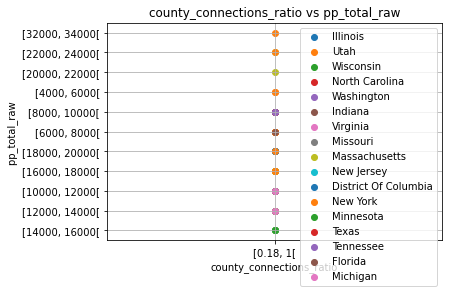

In [108]:
#para esto vere el gráfico de dispersion de county_connections_ratio vs pp_total_raw del df districts
#la idea es hace un gráfico de dinero invertido vs calidad de internet por estado para asi determinar que estados estaban mas preparados que otros

fig, ax = plt.subplots() #creacion del grafico

for state in districts_df["state"].unique(): #revisa la info ratio/raw por estado
    x= districts_df.loc[districts_df["state"]==state, "county_connections_ratio"]
    y= districts_df.loc[districts_df["state"]==state, "pp_total_raw"] 
    ax.scatter(x, y, label=state)
ax.legend() #se agrega leyenda
ax.grid() #se le agrega grillado para que sea más fácil su lecura

plt.xlabel("county_connections_ratio") #titulo eje x
plt.ylabel("pp_total_raw ") #titulo eje y
plt.title("county_connections_ratio vs pp_total_raw") #titulo del grafico
plt.show()

lamenablemente no puedo sacar conclusiones dado que no se observa relación aparente

* 1 ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?
* 2 ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?
* 3 ¿Cómo se relaciona la participación de los estudiantes con las plataformas de aprendizaje en línea con las diferentes geografías? ¿Contexto demográfico (por ejemplo, raza/etnia, ESL, discapacidad de aprendizaje)? Contexto de aprendizaje? ¿Estatus socioeconómico?
* 4 ¿Se correlacionan ciertas intervenciones, prácticas o políticas estatales (por ejemplo, estímulo, reapertura, moratoria de desalojo) con el aumento o la disminución de la participación en línea?

In [3]:
#para la 1 no se como medir aprendizaje ya que no se dan notas o rendimiento de alumnos
#para la 2 no se como ver la participacion de alumnos , supongo que los tipo de tecnologias seran los diferentes productos
#para la 3 mismo problema de como medir participacion, supongo aqui se consideran las variables  pct_black/hispanic (raza/etnia) pct_free/reduced (estatus socioeconomico?)
#para la 4 no se de donde sacar los datos de interveciones, practicas o politicas estataes.
